In [1]:
import importlib
import time
import math
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from scipy import ndimage
from sklearn.utils.extmath import randomized_svd

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence


In [2]:
from multi_loc import covariance, assimilate

In [3]:
%matplotlib inline

In [4]:
def imshow(X, title=None, vmin=None, vmax=None, cmap=None):
    plt.figure()
    im = plt.imshow(X, vmin=vmin, vmax=vmax, cmap=cmap)
    plt.colorbar(im)
    plt.title(title)

In [5]:
def angle(V0, V1):
    IPs = V0.T @ V1
    norm0 = (V0 ** 2).sum(axis=0)
    norm1 = (V1 ** 2).sum(axis=0)
    norm0 = norm0[:, None]
    norm1 = norm1[None, :]
    sigmas = sp.linalg.svd(
        IPs / np.sqrt(norm0 * norm1),
        compute_uv=False)
    dist = np.arccos(sigmas.min())
    return dist


def angle_2(V0, V1):
    norm0 = sp.linalg.norm(V0, ord=2, axis=0)
    norm1 = sp.linalg.norm(V1, ord=2, axis=0)
    V0 = V0/norm0
    V1 = V1/norm1
    IPs = V0.T @ V1
    sigmas = sp.linalg.svd(
        IPs,
        compute_uv=False)
    dist = np.arccos(sigmas)
    dist = dist.mean()
    return dist

In [6]:
def resample(ensemble, resample_size=None):
    if resample_size is None:
        resample_size = ensemble.shape[1]
    max_int = ensemble.shape[1]
    random_indexes = np.random.randint(0, max_int, resample_size)
    
    return ensemble[:, random_indexes]

In [7]:
dimension = 2**9
print(dimension)
rho0_l = 0.3
rho0_s = 0.03
# rho0 = 0.2
# dx = 0.25
dx = 1/dimension

# obs_size = int(dimension/2)
# H = assimilate.random_H(dimension, obs_size)

H = np.eye(dimension)[::2]
obs_size = H.shape[0]

rho = np.arange(dimension, dtype=float)
rho = np.minimum(rho, (dimension - rho) % dimension)
rho = rho*dx

512


In [8]:
eig_val_l, eig_vec_l, P_l, sort_index = covariance.generate_circulant(
    dimension, dx, rho0_l, covariance.fft_sqd_exp_1d,
    return_Corr=True, return_sort_ind=True)
print('long variance: ', eig_val_l.mean())
eig_val_l = eig_val_l / eig_val_l.mean()
sort_index = np.argsort(sort_index)
eig_val_l = eig_val_l[sort_index]
eig_vec_l = eig_vec_l[:, sort_index]
P_l = eig_vec_l @ np.diag(eig_val_l) @ eig_vec_l.conj().T
P_l = P_l.real

eig_val_s, eig_vec_s, P_s, sort_index = covariance.generate_circulant(
    dimension, dx, rho0_s, covariance.fft_sqd_exp_1d,
    return_Corr=True, return_sort_ind=True)
print('short variance: ', eig_val_s.mean())
eig_val_s = eig_val_s / eig_val_s.mean()
sort_index = np.argsort(sort_index)
eig_val_s = eig_val_s[sort_index]
eig_vec_s = eig_vec_s[:, sort_index]
P_s = eig_vec_s @ np.diag(eig_val_s) @ eig_vec_s.conj().T
P_s = P_s.real
#P_s = P_s/P_s.max()

al = 0.5
eig_val = (1 - al) * eig_val_s + al * eig_val_l
eig_vec = eig_vec_l.copy()

eig_val = eig_val / eig_val.mean()

sort_index = np.argsort(eig_val)[::-1]
eig_val = eig_val[sort_index]
eig_vec = eig_vec[:, sort_index]

P = eig_vec @ np.diag(eig_val) @ eig_vec.conj().T
P = P.real

sort_index = np.argsort(eig_val_l)[::-1]
eig_val_l = eig_val_l[sort_index]
eig_vec_l = eig_vec_l[:, sort_index]

sort_index = np.argsort(eig_val_s)[::-1]
eig_val_s = eig_val_s[sort_index]
eig_vec_s = eig_vec_s[:, sort_index]


R = np.eye(obs_size)

trans_mats_true = assimilate.transformation_matrices(
    H, eig_val_p=eig_val, eig_vec_p=eig_vec,
    R=R, return_Ts=True)


trans_mats_long = assimilate.transformation_matrices(
    H, eig_val_p=eig_val_l, eig_vec_p=eig_vec_l,
    R=R, return_Ts=True)


trans_mats_short = assimilate.transformation_matrices(
    H, eig_val_p=eig_val_s, eig_vec_p=eig_vec_s,
    R=R, return_Ts=True)


for key, val in trans_mats_true.items():
    exec(key + '=val')
for key, val in trans_mats_long.items():
    exec(key+'_l' + '=val')
for key, val in trans_mats_short.items():
    exec(key+'_s' + '=val')

long variance:  1.007731840725672
short variance:  1.0


Log10(condition):  19.644439415277176


Text(0.5,0.98,'Eigenvalues P_s')

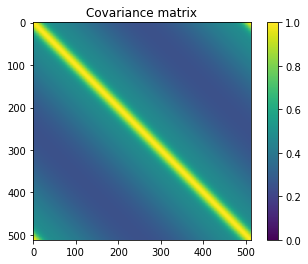

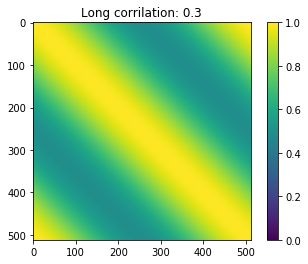

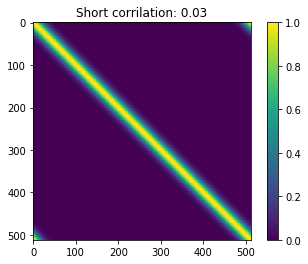

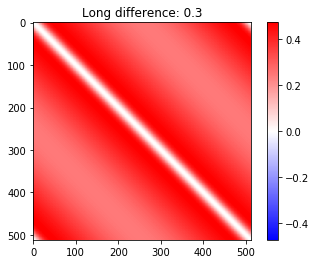

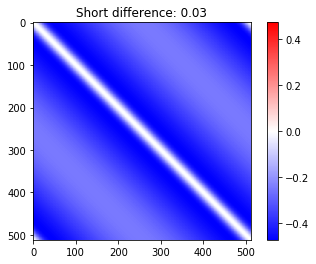

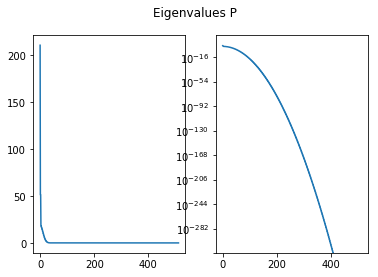

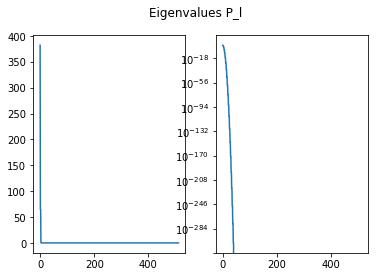

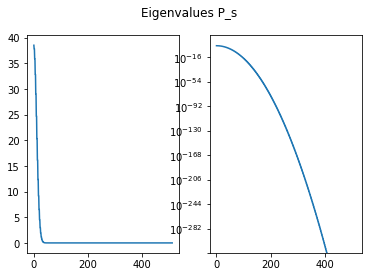

In [9]:
imshow(P, title='Covariance matrix', vmin=0, vmax=1)
imshow(P_l, title=f'Long corrilation: {rho0_l}', vmin=0, vmax=1)
imshow(P_s, title=f'Short corrilation: {rho0_s}', vmin=0, vmax=1)

error_l = P_l - P
error_s = P_s - P

vmax = np.max([np.abs(error_l).max(),
               np.abs(error_s).max()])

imshow(error_l, title=f'Long difference: {rho0_l}',
       vmin=-vmax, vmax=vmax, cmap='bwr')
imshow(error_s, title=f'Short difference: {rho0_s}',
       vmin=-vmax, vmax=vmax, cmap='bwr')
print('Log10(condition): ',
      np.log10(np.linalg.cond(P)))

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val)
ax[1].semilogy(eig_val)
plt.suptitle('Eigenvalues P')

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val_l)
ax[1].semilogy(eig_val_l)
plt.suptitle('Eigenvalues P_l')

fig, ax = plt.subplots(1, 2)
ax[0].plot(eig_val_s)
ax[1].semilogy(eig_val_s)
plt.suptitle('Eigenvalues P_s')

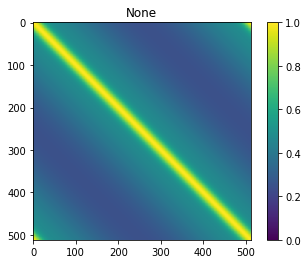

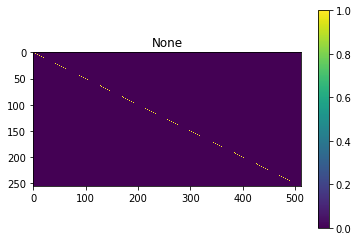

In [10]:
imshow(P, vmin=0)
imshow(H)

In [11]:
# x = np.arange(dimension, dtype=float)*(2 * np.pi)/dimension
# A = 0.4
# D = np.diag(np.sqrt(-0.5 * A * (np.cos(x) + 1) + 1))
# print((D.diagonal()**2).min())
# print((D.diagonal()**2).max())
# plt.figure()
# plt.plot(x, D.diagonal())
# imshow(D)

In [12]:
# P = D @ P @ D

In [13]:
# imshow(P, vmin=0)
# imshow(H)

In [16]:
trans_mats = assimilate.transformation_matrices(
    H, P=P,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    print(key)
    exec(key + '=val')

P_sqrt
P_inv_sqrt
R_sqrt
R_inv_sqrt
U
S
VT
H
Tx
Tx_inv
Ty
Ty_inv


In [17]:
trans_mats = assimilate.transformation_matrices(
    H, P=P_l,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    key = key + '_l'
    print(key)
    exec(key + '=val')

P_sqrt_l
P_inv_sqrt_l
R_sqrt_l
R_inv_sqrt_l
U_l
S_l
VT_l
H_l
Tx_l
Tx_inv_l
Ty_l
Ty_inv_l


In [18]:
trans_mats = assimilate.transformation_matrices(
    H, P=P_s,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    key = key + '_s'
    print(key)
    exec(key + '=val')

P_sqrt_s
P_inv_sqrt_s
R_sqrt_s
R_inv_sqrt_s
U_s
S_s
VT_s
H_s
Tx_s
Tx_inv_s
Ty_s
Ty_inv_s


In [61]:
print((eig_val).sum())
print((eig_val_l).sum())
print((eig_val_s).sum())

511.99999999999994
512.0
512.0


In [62]:
print(S.diagonal().sum())
print(S_l.diagonal().sum())
print(S_s.diagonal().sum())

print((S.diagonal()**2).sum())
print((S_l.diagonal()**2).sum())
print((S_s.diagonal()**2).sum())

69.49696752180758
25.993808645053637
82.51433263115234
255.99999999999937
255.9999999999994
255.99999999999983


<IPython.core.display.Javascript object>


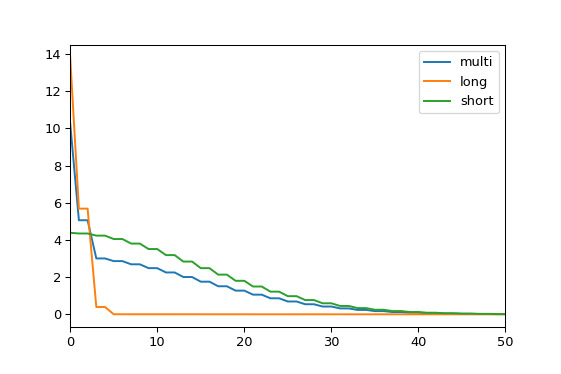

In [193]:
plt.figure()
plt.plot(S.diagonal())
plt.plot(S_l.diagonal())
plt.plot(S_s.diagonal())
plt.xlim([0, 50])
plt.legend(['multi', 'long', 'short'])

<IPython.core.display.Javascript object>


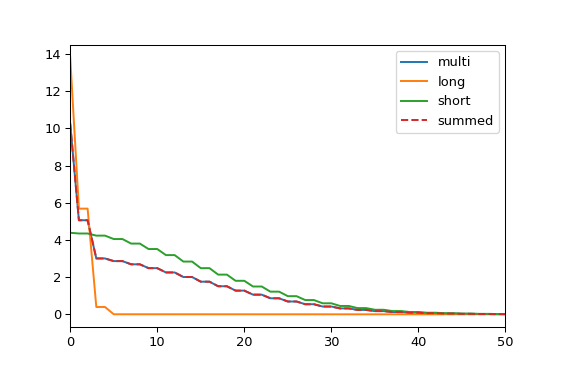

In [192]:
this = np.sqrt(0.5 * (S_l.diagonal()**2 + S_s.diagonal()**2))

plt.figure()
plt.plot(S.diagonal())
plt.plot(S_l.diagonal())
plt.plot(S_s.diagonal())
plt.plot(this, '--')
plt.xlim([0, 50])
plt.legend(['multi', 'long', 'short', 'summed'])

In [194]:
ens_size = 30
ens_ens_size = 20
resample_size = None
mu = np.zeros(dimension)
ensemble = (
    assimilate.generate_ensemble(
        ens_size, mu, P_sqrt))
P_sample = np.cov(ensemble)
P_sample_array = np.ones([dimension, dimension, ens_ens_size])
for ens_ens_num in range(ens_ens_size):
    temp_ens = resample(ensemble=ensemble,
                        resample_size=resample_size)
    P_sample_array[:, :, ens_ens_num] = np.cov(temp_ens)

<IPython.core.display.Javascript object>


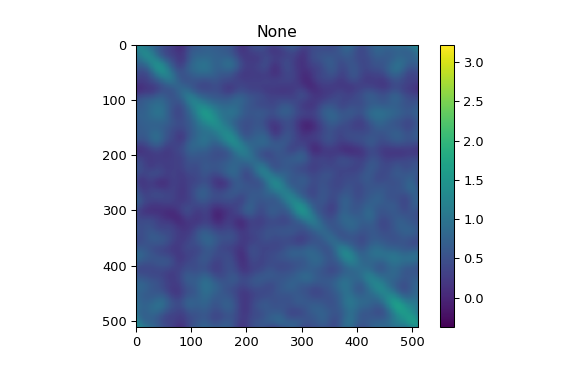

<IPython.core.display.Javascript object>


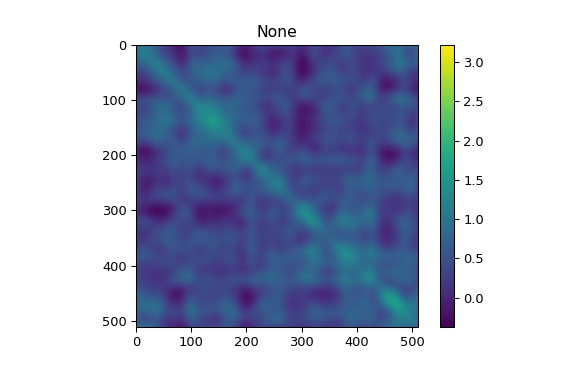

<IPython.core.display.Javascript object>


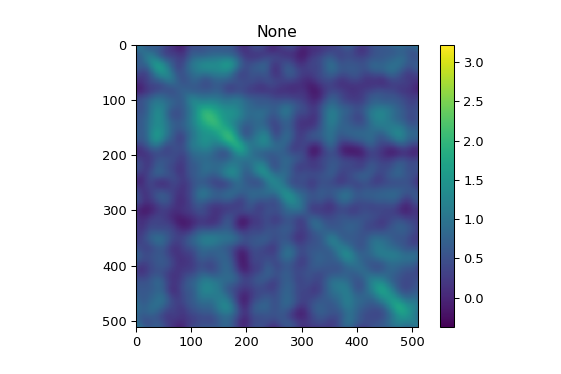

<IPython.core.display.Javascript object>


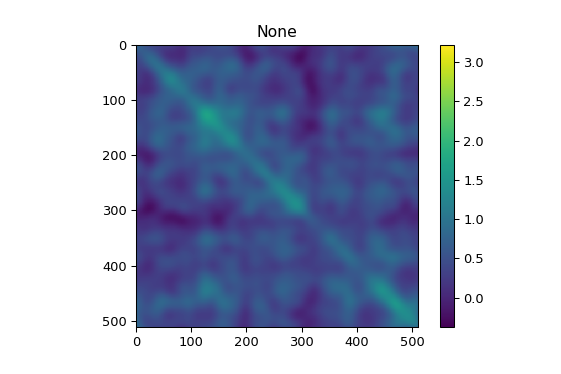

<IPython.core.display.Javascript object>


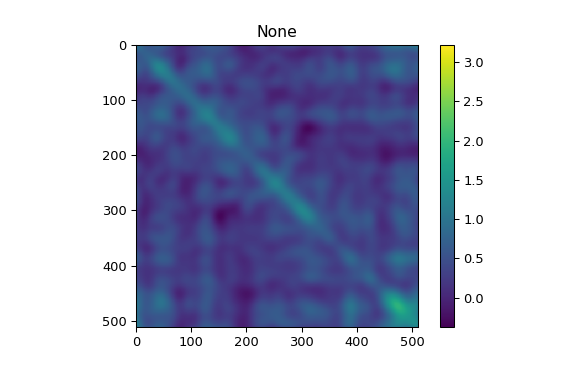

<IPython.core.display.Javascript object>


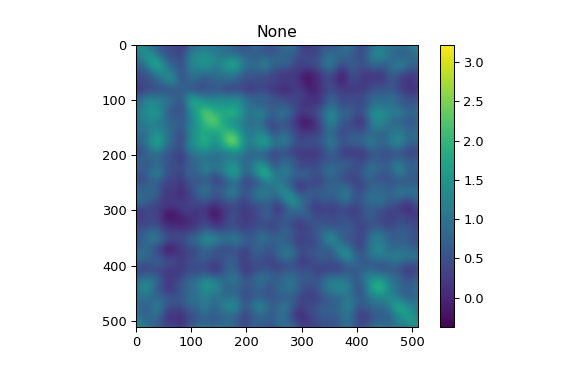

<IPython.core.display.Javascript object>


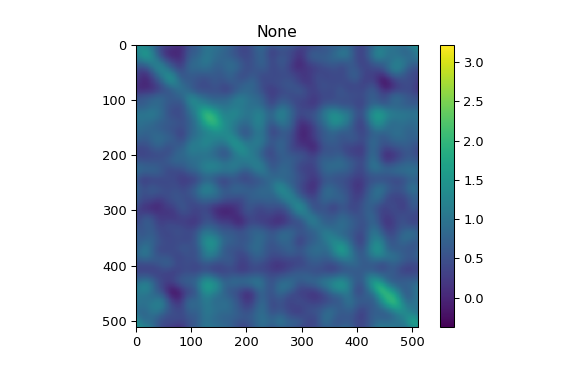

<IPython.core.display.Javascript object>


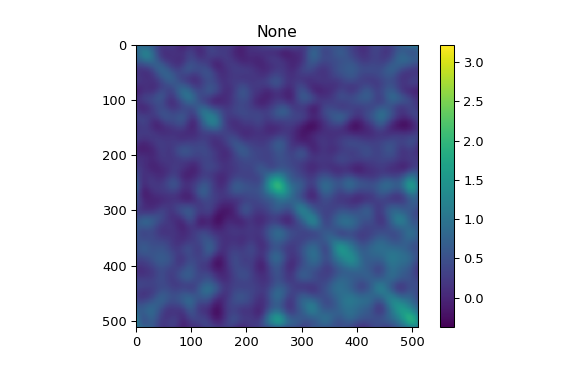

<IPython.core.display.Javascript object>


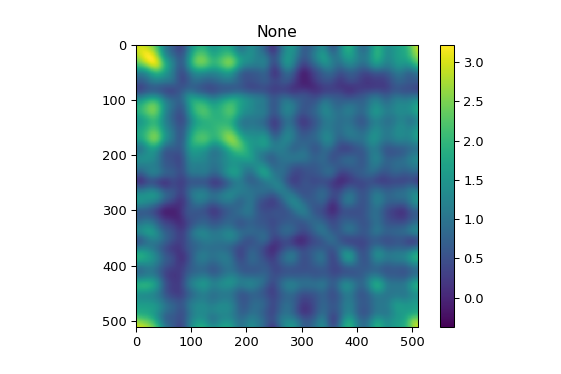

<IPython.core.display.Javascript object>


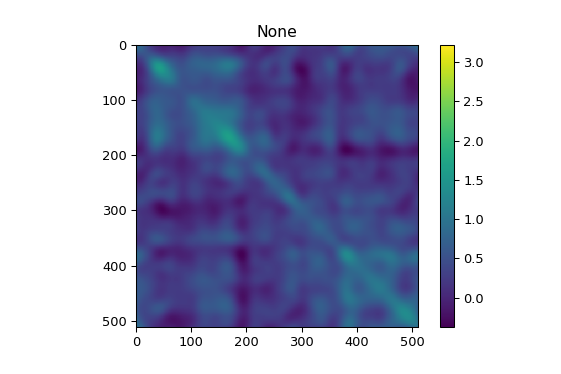

<IPython.core.display.Javascript object>


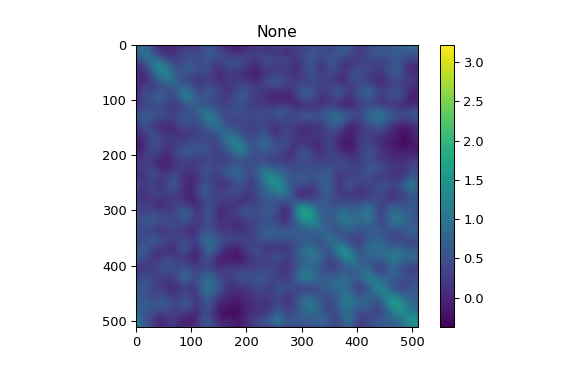

<IPython.core.display.Javascript object>


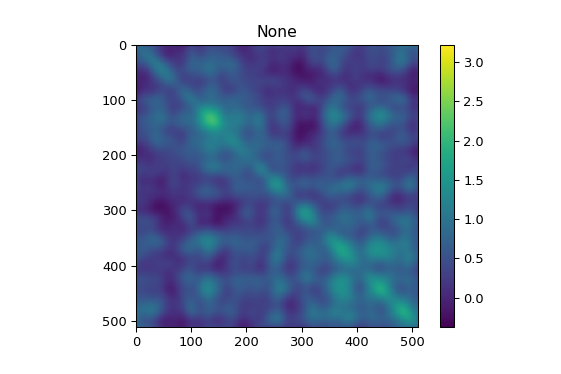

<IPython.core.display.Javascript object>


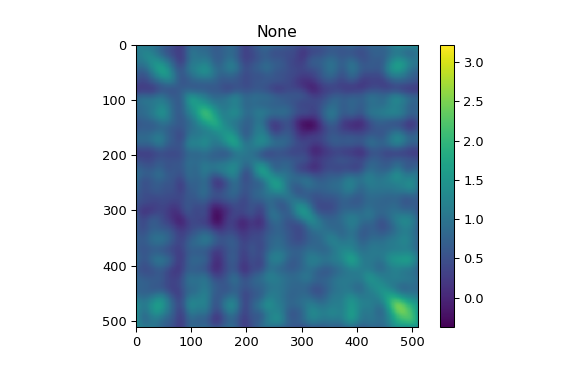

<IPython.core.display.Javascript object>


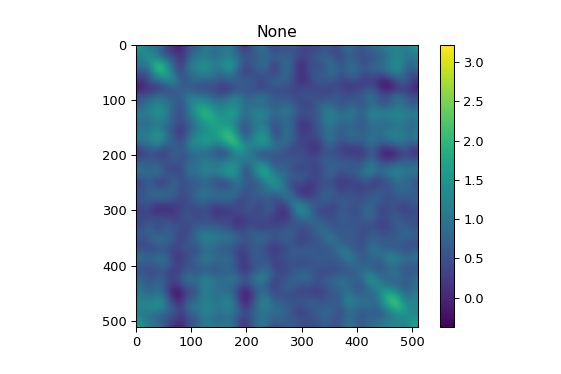

<IPython.core.display.Javascript object>


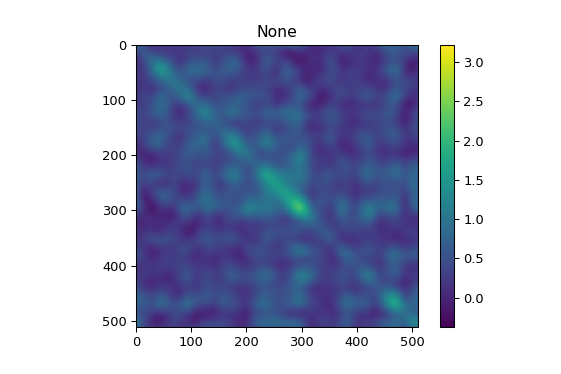

<IPython.core.display.Javascript object>


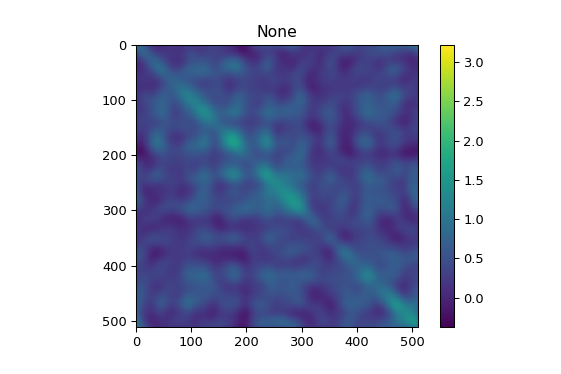

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


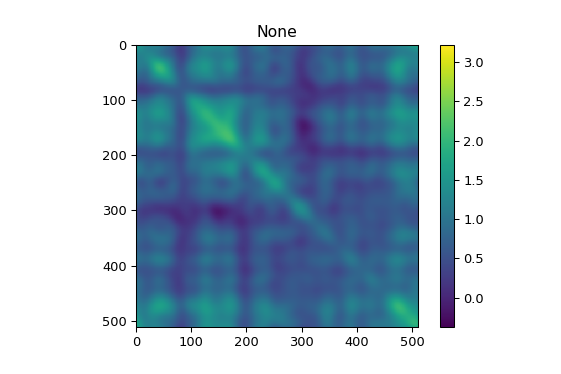

<IPython.core.display.Javascript object>


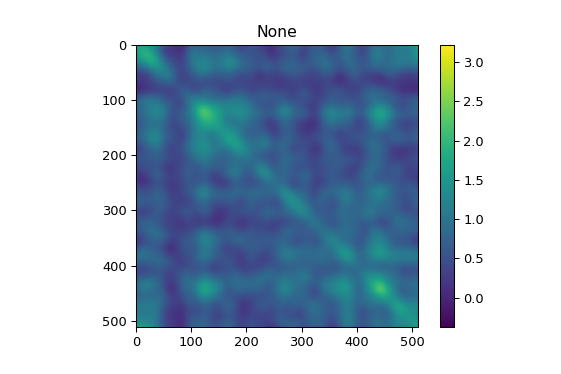

<IPython.core.display.Javascript object>


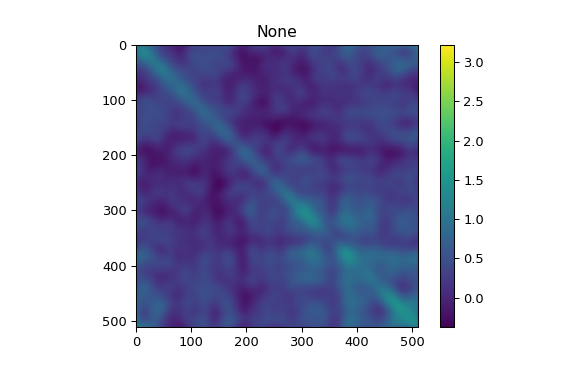

<IPython.core.display.Javascript object>


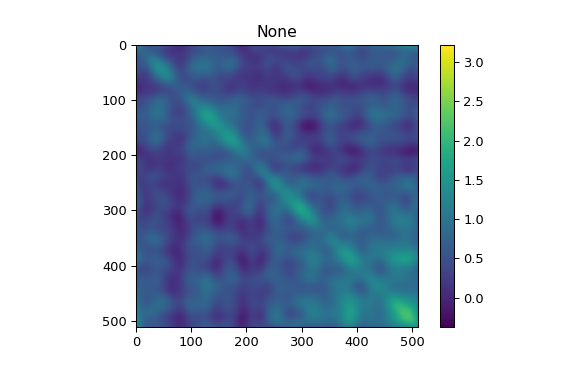

<IPython.core.display.Javascript object>


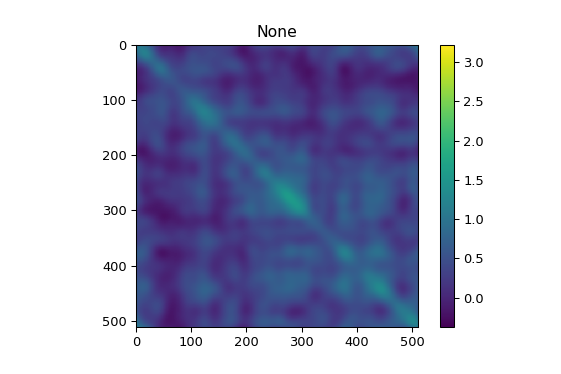

In [196]:
vmin = np.min([P_sample.min(),
               P_sample_array.min()])
vmax = np.max([P_sample.max(),
               P_sample_array.max()])
imshow(P_sample, vmin=vmin, vmax=vmax)
for ens_ens_num in range(ens_ens_size):
    imshow(P_sample_array[:, :, ens_ens_num],
           vmin=vmin, vmax=vmax)

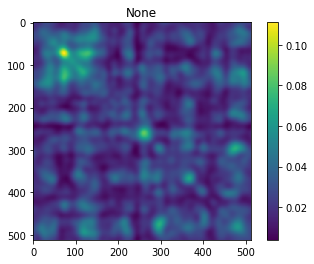

In [67]:
imshow(np.var(P_sample_array, axis=-1))

In [198]:
# sig_array = np.concatenate(
#     [[1], np.repeat([2], 12)])
sig_array = np.concatenate(
    [[1], np.repeat([2], 5), np.repeat([4], 5), np.repeat([6], 5)])
# rho_array = np.linspace(0.05, 0.3, 40)
rho_array = np.arange(0.01, 0.61, 0.015)
total_sig = sig_array.sum()
sig_bin_num = sig_array.size

s_array = np.ones([total_sig, rho_array.size, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, rho_array.size, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, rho_array.size, ens_ens_size]) * np.nan

sig_num = sig_array[0]

eye_array = np.repeat(np.eye(dimension)[:, :, None], ens_ens_size, axis=-1)
proj_array = eye_array.copy()
proj = np.eye(dimension)


V_average_angle_2_truth= np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
V_average_angle = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
V_master_angle = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan

error_n2 = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
exp_error_n2 = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
error_n2_master = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan

comb_num = round(
    math.factorial(ens_ens_size)
    / (math.factorial(2) 
       * math.factorial(ens_ens_size - 2)))


opt_rho_array = np.ones(sig_bin_num) * np.nan
opt_rho_index_array = opt_rho_array.copy()
opt_s_array_ens = np.ones([total_sig, ens_ens_size]) * np.nan
opt_U_array_ens = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
opt_V_array_ens = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

opt_s_array = np.ones([total_sig]) * np.nan
opt_U_array = np.ones([obs_size, total_sig]) * np.nan
opt_V_array = np.ones([dimension, total_sig]) * np.nan

In [ ]:
proj = np.eye(dimension)
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T
    reduced_true = (U[:, sig_slice]
                    @ S[sig_slice, sig_slice]
                    @ VT[sig_slice])
    for rho_count, rho_loc in enumerate(rho_array):
        print(rho_count, end='; ')
        [loc] = covariance.generate_circulant(
            dimension, dx, rho_loc, covariance.fft_sqd_exp_1d,
            return_Corr=True, return_eig=False)
        loc /= loc.max()
        reduced_array = np.ones([obs_size,
                                 dimension,
                                 ens_ens_size]) * np.nan
        for ens_count in range(ens_ens_size):
            P_loc = P_sample_array[:, :, ens_count] * loc
            this_P_sqrt = covariance.matrix_sqrt(P_loc).real
            
            aU, aS, aVT = randomized_svd(
                H @ this_P_sqrt @ proj_array[:, :, ens_count],
                n_components=sig_num)

            aS = np.diag(aS)


            U_array[:, sig_slice, rho_count, ens_count] = aU
            s_array[sig_slice, rho_count, ens_count] = aS.diagonal()
            V_array[:, sig_slice, rho_count, ens_count] = aVT.T
            
            reduced_array[:, :, ens_count] = (
                aU @ aS @ aVT)
            
        angle_2_truth = np.ones(ens_ens_size) * np.nan
        ens_error_n2 = np.ones(ens_ens_size) * np.nan
        
        comb_count = 0
        angles = np.ones(comb_num) * np.nan
        errors = np.ones(comb_num) * np.nan
        for ens_count in range(ens_ens_size):
            aV = V_array[:, sig_slice, rho_count, ens_count]
            
            angle_2_truth[ens_count] = angle(aV, true_V)
            ens_error_n2[ens_count] = sp.linalg.norm(
                reduced_array[:, :, ens_count] - reduced_true,
                ord=2)
            for other_ens_count in range(ens_count + 1, ens_ens_size):
                oV = V_array[:, sig_slice, rho_count, other_ens_count]
                this_angle = angle(aV, oV)
                angles[comb_count] = this_angle
                this_error = sp.linalg.norm(
                    reduced_array[:, :, ens_count]
                    - reduced_array[:, :, other_ens_count],
                    ord=2)
                errors[comb_count] = this_error
                comb_count += 1
        V_average_angle[sig_count, rho_count] = angles.mean()
        V_average_angle_2_truth[sig_count, rho_count] = angle_2_truth.mean()
        error_n2[sig_count, rho_count] = ens_error_n2.mean()
        exp_error_n2[sig_count, rho_count] = errors.mean()
        
    opt_rho_index =  V_average_angle[sig_count].argmin()
    opt_rho_index_array[sig_count] = opt_rho_index
    opt_rho_array[sig_count] = rho_array[opt_rho_index]
    opt_U_array_ens[:, sig_slice] = U_array[:, sig_slice, opt_rho_index, :]
    opt_s_array_ens[sig_slice] = s_array[sig_slice, opt_rho_index, :]
    opt_V_array_ens[:, sig_slice] = V_array[:, sig_slice, opt_rho_index, :]
    
    proj_array = eye_array - np.einsum(
        'ij...,kj...->ik...',
        opt_V_array_ens[:, :sig_slice.stop],
        opt_V_array_ens[:, :sig_slice.stop])

    
    
    
    # calculate master V
    [loc] = covariance.generate_circulant(
        dimension, dx, opt_rho_array[sig_count],
        covariance.fft_sqd_exp_1d,
        return_Corr=True, return_eig=False)
    loc /= loc.max()
    
    P_loc = P_sample * loc
    this_P_sqrt = covariance.matrix_sqrt(P_loc).real
    aU, aS, aVT = sp.linalg.svd(
        H @ this_P_sqrt @ proj)
    aS = np.diag(aS)
    aS = np.concatenate(
        [aS, np.zeros([obs_size, dimension - obs_size])],
        axis=1)
#     aVT = aVT @ proj
    
#     P_loc = np.cov(ensemble_array.reshape(
#         dimension, ens_size * ens_ens_size))
#     P_loc = (P_loc * loc) @ proj
#     this_trans_mats = assimilate.transformation_matrices(
#         H, P=P_loc,
#         R=R, return_Ts=True)

#     aU = this_trans_mats['U']
#     aS = this_trans_mats['S']
#     aVT = this_trans_mats['VT']

    opt_U_array[:, sig_slice] = aU[:, :sig_num]
    opt_s_array[sig_slice] = aS.diagonal()[:sig_num]
    V_opt = aVT[:sig_num, :].T
    opt_V_array[:, sig_slice] = V_opt
    
#     this_proj = np.eye(dimension) - V_opt @ V_opt.T
#     proj = proj @ this_proj
    proj = np.eye(dimension) - (opt_V_array[:, :sig_slice.stop]
                                @ opt_V_array[:, :sig_slice.stop].T)


slice(0, 1, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(1, 3, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(3, 5, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(5, 7, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(7, 9, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(9, 11, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 3

In [ ]:
plt.figure()
plt.plot(opt_rho_array)
plt.xlabel('Sigma bin')
plt.ylabel('localization length')

In [ ]:
last_sig = 0
print(f'Ens size: {ens_size}', '\n')
print(f'Ens of ens size: {ens_ens_size}', '\n')
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    last_sig = last_sig + sig_num
    print(f'Current singular values: {sig_slice}', '\n')

    e2_arg = error_n2[sig_count].argmin()
    this_rho = rho_array[e2_arg]
    print(f'Minimize norm2 error: {this_rho:0.4}', '\n')

    ea_arg = V_average_angle[sig_count].argmin()
    this_rho = rho_array[ea_arg]
    print(f'Minimize average angle among ensembles: {this_rho:0.4}', '\n')

    aa_arg = V_average_angle_2_truth[sig_count].argmin()
    this_rho = rho_array[aa_arg]
    print(f'Minimize average angle from truth: {this_rho:0.4}', '\n')
    
    plt.figure()
    plt.plot(rho_array, exp_error_n2[sig_count])
    plt.title(f'Expected n2 error: {sig_slice}')
    plt.ylabel('Error (norm2)')
    plt.xlabel('localization radius')

    plt.figure()
    plt.plot(rho_array, error_n2[sig_count])
    plt.scatter(rho_array[e2_arg],
                error_n2[sig_count, e2_arg])
    plt.title(f'Actual n2 error: {sig_slice}')
    plt.ylabel('Error (norm2)')
    plt.xlabel('localization radius')


    plt.figure()
    plt.plot(rho_array, V_average_angle[sig_count])
    plt.plot(rho_array, V_average_angle_2_truth[sig_count])
    plt.scatter(rho_array[ea_arg],
                V_average_angle[sig_count, ea_arg])
    plt.scatter(rho_array[aa_arg],
                V_average_angle_2_truth[sig_count, aa_arg])
    plt.legend(['Among ens', 'From truth'])
    plt.xlabel('Localization Radius')
    plt.ylabel('Angle (radians)')
    plt.title(f'Mean of angle: {sig_slice}')

In [ ]:
this_P_sqrt = covariance.matrix_sqrt(P_sample).real
imshow(H @ this_P_sqrt, 'H @ P_sample_sqrt')

# Using 'opt' singular values

In [ ]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig])
    this_recon = (
        opt_U_array[:, :this_sig]
        @ np.diag(opt_s_array[:this_sig])
        @ opt_V_array[:, :this_sig].T)

#         this_recon = (
#             opt_U_array[:, :this_sig, ens_count]
#             @ S[:this_sig, :this_sig]
#             @ opt_V_array[:, :this_sig, ens_count].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

# Using True singular values


In [ ]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig])
        
    this_recon = (
        opt_U_array[:, :this_sig]
        @ S[:this_sig, :this_sig]
        @ opt_V_array[:, :this_sig].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

In [ ]:
sample_U_array = np.ones([obs_size, total_sig, ens_ens_size])
sample_s_array = np.ones([total_sig, ens_ens_size])
sample_V_array = np.ones([dimension, total_sig, ens_ens_size])
for ens_count in range(ens_ens_size):
    this_P = P_sample_array[:, :, ens_count]
    this_trans_mats = assimilate.transformation_matrices(
        H, P=this_P,
        R=R, return_Ts=True)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    sample_U_array[:, :, ens_count] = aU[:, :total_sig]
    sample_s_array[:, ens_count] = aS.diagonal()[:total_sig]
    sample_V_array[:, :, ens_count] = aVT[:total_sig, :].T

# Using Sample singular values


In [ ]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig]) 
    this_recon = (
        opt_U_array[:, :this_sig]
        @ np.diag(sample_s_array[:this_sig, 0])
        @ opt_V_array[:, :this_sig].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

In [ ]:
# plt.figure()
# plt.plot(S.diagonal()[:total_sig])
# plt.plot(sample_s_array[:total_sig], marker='.')
# plt.plot(opt_s_array[:total_sig])

# plt.figure()
# plt.semilogy(S.diagonal()[:total_sig])
# plt.semilogy(sample_s_array[:total_sig], marker='.')
# plt.semilogy(opt_s_array[:total_sig])

In [ ]:
# sample_angle = np.ones(sig_bin_num) * np.nan
# last_sig = 0

# for sig_count, sig_num in enumerate(sig_array):
#     sig_slice = slice(last_sig, last_sig + sig_num)
#     last_sig = last_sig + sig_num
#     this_true_V = VT[sig_slice].T
#     angles = np.ones(ens_ens_size) * np.nan
#     for ens_count in range(ens_ens_size):
#         this_V = sample_V_array[:, sig_slice, ens_count]
#         angles[ens_count] = angle(this_V, this_true_V)
#     sample_angle[sig_count] = angles.mean()

In [ ]:
trans_mats = assimilate.transformation_matrices(
    H, P=P_sample,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    print(key)
    exec(key + '_sample'+ '=val')

In [ ]:
sample_angle = np.ones(sig_bin_num) * np.nan
localized_angle = np.ones(sig_bin_num) * np.nan
last_sig = 0

for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    last_sig = last_sig + sig_num
    this_true_V = VT[sig_slice].T
    
    this_V = VT_sample[sig_slice].T
    sample_angle[sig_count] = angle(this_V, this_true_V)
    
    this_V = opt_V_array[:, sig_slice]
    localized_angle[sig_count] = angle(this_V, this_true_V)

In [ ]:
plt.figure()
plt.plot(sample_angle)

plt.plot(localized_angle)
plt.legend(['Sample',
            'localized'])

In [ ]:
imshow(H @ P_sqrt)

In [ ]:
# truth = H @ P_sqrt
# true_reconstruct = (
#     U[:, :total_sig]
#     @ S[:total_sig, :total_sig]
#     @ VT[:total_sig, :])
# sample_reconstruct = (
#     U_sample[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ VT_sample[:total_sig, :])
# # opt_reconstruct = (
# #     opt_U_array[:, :total_sig]
# #     @ S_sample[:total_sig, :total_sig]
# #     @ opt_V_array[:, :total_sig].T)
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ np.diag(opt_s_array[:total_sig])
#     @ opt_V_array[:, :total_sig].T)
# vmin = np.min([
#     truth.min(),
#     true_reconstruct.min(),
#     sample_reconstruct.min(),
#     opt_reconstruct.min()
# ])
# vmax = np.max([
#     truth.max(),
#     true_reconstruct.max(),
#     sample_reconstruct.max(),
#     opt_reconstruct.max()
# ])
# imshow(truth,
#        vmin=vmin, vmax=vmax)
# imshow(true_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(sample_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(opt_reconstruct,
#        vmin=vmin, vmax=vmax)

In [ ]:
this_total_sig = total_sig

truth = H @ P_sqrt
true_reconstruct = (
    U[:, :this_total_sig]
    @ S[:this_total_sig, :this_total_sig]
    @ VT[:this_total_sig, :])
sample_reconstruct = (
    U_sample[:, :this_total_sig]
    @ S_sample[:this_total_sig, :this_total_sig]
    @ VT_sample[:this_total_sig, :])
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ opt_V_array[:, :total_sig].T)
opt_reconstruct = (
    opt_U_array[:, :this_total_sig]
    @ np.diag(opt_s_array[:this_total_sig])
    @ opt_V_array[:, :this_total_sig].T)
vmin = np.min([
    truth.min(),
    true_reconstruct.min(),
    sample_reconstruct.min(),
    opt_reconstruct.min()
])
vmax = np.max([
    truth.max(),
    true_reconstruct.max(),
    sample_reconstruct.max(),
    opt_reconstruct.max()
])
imshow(truth,
       vmin=vmin, vmax=vmax)
imshow(true_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(sample_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct,
       vmin=vmin, vmax=vmax)

In [ ]:
error_sample = (sample_reconstruct
                - true_reconstruct)
error_opt = (opt_reconstruct
             - true_reconstruct)
vmax = np.max([
    np.abs(error_sample).max(),
    np.abs(error_opt).max()
])

imshow(error_sample,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')

In [ ]:
vmin = np.min([(sample_reconstruct @ H.T).min(),
               (opt_reconstruct @ H.T).min()])
vmax = np.max([(sample_reconstruct @ H.T).max(),
               (opt_reconstruct @ H.T).max()])
imshow(sample_reconstruct @ H.T, vmin=vmin, vmax=vmax)
imshow(opt_reconstruct @ H.T, vmin=vmin, vmax=vmax)

In [ ]:
# truth = H @ P_sqrt
# true_reconstruct = (
#     U[:, :total_sig]
#     @ S[:total_sig, :total_sig]
#     @ VT[:total_sig, :])
# sample_reconstruct = (
#     U_sample[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ VT_sample[:total_sig, :])
# # opt_reconstruct = (
# #     opt_U_array[:, :total_sig]
# #     @ S_sample[:total_sig, :total_sig]
# #     @ opt_V_array[:, :total_sig].T)
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ np.diag(opt_s_array[:total_sig])
#     @ opt_V_array[:, :total_sig].T)

# scale = ((sample_reconstruct @ H.T).diagonal().mean()
#          / (opt_reconstruct @ H.T).diagonal().mean())
# opt_reconstruct = opt_reconstruct * scale


# vmin = np.min([
#     truth.min(),
#     true_reconstruct.min(),
#     sample_reconstruct.min(),
#     opt_reconstruct.min()
# ])
# vmax = np.max([
#     truth.max(),
#     true_reconstruct.max(),
#     sample_reconstruct.max(),
#     opt_reconstruct.max()
# ])
# imshow(truth,
#        vmin=vmin, vmax=vmax)
# imshow(true_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(sample_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(opt_reconstruct,
#        vmin=vmin, vmax=vmax)

In [ ]:
print(np.sum(S.diagonal()[:total_sig]**2))
print(np.sum(S_sample.diagonal()[:total_sig]**2))
print(np.sum(opt_s_array[:total_sig]**2))
scale = (
    np.sum(S_sample.diagonal()[:total_sig]**2)
    / np.sum(opt_s_array[:total_sig]**2))
print(this_scale)
opt_s_array_scaled = np.sqrt(opt_s_array[:total_sig]**2 * this_scale)
print(np.sum(opt_s_array_scaled**2))

In [ ]:
truth = H @ P_sqrt
true_reconstruct = (
    U[:, :this_total_sig]
    @ S[:this_total_sig, :this_total_sig]
    @ VT[:this_total_sig, :])
sample_reconstruct = (
    U_sample[:, :this_total_sig]
    @ S_sample[:this_total_sig, :this_total_sig]
    @ VT_sample[:this_total_sig, :])
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ opt_V_array[:, :total_sig].T)
opt_reconstruct = (
    opt_U_array[:, :this_total_sig]
    @ np.diag(opt_s_array[:this_total_sig])
    @ opt_V_array[:, :this_total_sig].T)

opt_reconstruct_scaled = (
    opt_U_array[:, :this_total_sig]
    @ np.diag(opt_s_array_scaled[:this_total_sig])
    @ opt_V_array[:, :this_total_sig].T)


vmin = np.min([
    truth.min(),
    true_reconstruct.min(),
    sample_reconstruct.min(),
    opt_reconstruct.min(),
    opt_reconstruct_scaled.min()
])
vmax = np.max([
    truth.max(),
    true_reconstruct.max(),
    sample_reconstruct.max(),
    opt_reconstruct.max(),
    opt_reconstruct_scaled.max()
])
imshow(truth,
       vmin=vmin, vmax=vmax)
imshow(true_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(sample_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct_scaled,
       vmin=vmin, vmax=vmax)

In [ ]:
error_sample = (sample_reconstruct
                - true_reconstruct)
error_opt = (opt_reconstruct
             - true_reconstruct)
error_opt_scaled = (opt_reconstruct_scaled
                    - true_reconstruct)
diff_scaled = (opt_reconstruct_scaled
               - opt_reconstruct)

vmax = np.max([
    np.abs(error_sample).max(),
    np.abs(error_opt).max(),
    np.abs(error_opt_scaled).max()
])

imshow(error_sample,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt_scaled,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')

vmax = np.abs(diff_scaled).max()
imshow(diff_scaled,
       vmax=vmax,
       vmin=-vmax,
       cmap='bwr')

In [ ]:
print((S.diagonal()[:total_sig]**2).sum())
print((S_sample.diagonal()[:total_sig]**2).sum())
print((opt_s_array[:total_sig]**2).sum())
print((opt_s_array_scaled[:total_sig]**2).sum())

In [ ]:
%matplotlib notebook

In [ ]:
opt_sum = opt_s_array[:total_sig].sum()
sample_sum = S_sample.diagonal()[:total_sig].sum()
plt.figure()
plt.plot(S.diagonal()[:total_sig])
plt.plot(S_sample.diagonal()[:total_sig])
plt.plot(opt_s_array[:total_sig])
plt.plot(opt_s_array_scaled[:total_sig])
plt.legend([
    'Truth',
    'Sample',
    'Optimal',
    'Scaled'
])

plt.figure()
plt.semilogy(S.diagonal()[:total_sig])
plt.semilogy(S_sample.diagonal()[:total_sig])
plt.semilogy(opt_s_array[:total_sig])
plt.semilogy(opt_s_array_scaled[:total_sig])
plt.legend([
    'Truth',
    'Sample',
    'Optimal',
    'Scaled'
])

In [ ]:
plt.figure()
plt.plot((sample_reconstruct @ H.T).diagonal())
plt.plot((opt_reconstruct @ H.T).diagonal())
plt.plot((opt_reconstruct_scaled @ H.T).diagonal())

plt.legend(['Sample diag',
            'Opt diag',
            'Opt diag scaled'])

In [ ]:
imshow(V_average_angle_2_truth,
       title='Average angle to truth')
plt.xticks(np.arange(rho_array.size)[::5],
           np.round(rho_array[::5], 2), rotation=90)
plt.xlabel('localization')
plt.ylabel('Singular vector group')

imshow(V_average_angle,
       title='Average angle in ensemble')
plt.xticks(np.arange(rho_array.size)[::5],
           np.round(rho_array[::5], 2), rotation=90)
plt.xlabel('localization')
plt.ylabel('Singular vector group')

In [ ]:
for this_sig in np.arange(10):
    plt.figure()
    plt.plot(VT[this_sig])
    plt.title(f'True Value: {this_sig}')
    
    plt.figure()
    plt.plot(opt_V_array[:, this_sig])
    plt.title(f'With Localization: {this_sig}')
    
    plt.figure()
    plt.plot(VT_sample[this_sig])
    plt.title(f'Without Localization: {this_sig}')
    
#     plt.figure()
#     plt.plot(sample_V_array[:, this_sig])
#     plt.title(f'Without Localization: {this_sig}')

In [ ]:
for this_sig in np.arange(10):
    plt.figure()
    plt.plot(VT[this_sig])
    plt.plot(opt_V_array[:, this_sig])    
    plt.plot(VT_sample[this_sig])
    plt.title(f'For singular value: {this_sig}')
    plt.legend(['True Value',
                'Localized',
                'Unlocalized'])

In [ ]:
imshow(opt_V_array.T @ opt_V_array)

In [ ]:
this = opt_V_array.T @ opt_V_array
indexes = np.diag_indices_from(this)
this[indexes] = 0
vmax = np.abs(this).max()
imshow(this, vmax=vmax, vmin=-vmax, cmap='bwr')

# With a windowed angle calculation
# Window meaning including the previous and next 2 directions when calculating minimum angle

In [49]:
# ens_size = 60
# ens_ens_size = 20
# resample_size = None
# mu = np.zeros(dimension)
# ensemble = (
#     assimilate.generate_ensemble(
#         ens_size, mu, P_sqrt))
# P_sample = np.cov(ensemble)
# P_sample_array = np.ones([dimension, dimension, ens_ens_size])
# for ens_ens_num in range(ens_ens_size):
#     temp_ens = resample(ensemble=ensemble,
#                         resample_size=resample_size)
#     P_sample_array[:, :, ens_ens_num] = np.cov(temp_ens)

In [50]:
# vmin = np.min([P_sample.min(),
#                P_sample_array.min()])
# vmax = np.max([P_sample.max(),
#                P_sample_array.max()])
# imshow(P_sample, vmin=vmin, vmax=vmax)
# for ens_ens_num in range(ens_ens_size):
#     imshow(P_sample_array[:, :, ens_ens_num],
#            vmin=vmin, vmax=vmax)

In [51]:
# imshow(np.var(P_sample_array, axis=-1))

In [52]:
# sig_array = np.concatenate(
#     [[1], np.repeat([2], 12)])
sig_array = np.concatenate(
    [[1], np.repeat([4], 5), np.repeat([6], 5), np.repeat([8], 2)])
# rho_array = np.linspace(0.05, 0.3, 40)
rho_array = np.arange(0.01, 0.61, 0.015)
total_sig = sig_array.sum()
sig_bin_num = sig_array.size

s_array = np.ones([total_sig, rho_array.size, ens_ens_size]) * np.nan
U_array = np.ones([obs_size, total_sig, rho_array.size, ens_ens_size]) * np.nan
V_array = np.ones([dimension, total_sig, rho_array.size, ens_ens_size]) * np.nan

sig_num = sig_array[0]

eye_array = np.repeat(np.eye(dimension)[:, :, None], ens_ens_size, axis=-1)
proj_array = eye_array.copy()
proj = np.eye(dimension)


V_average_angle_2_truth= np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
V_average_angle = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
V_master_angle = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan

error_n2 = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
exp_error_n2 = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan
error_n2_master = np.ones(
    [sig_bin_num, rho_array.size]) * np.nan

comb_num = round(
    math.factorial(ens_ens_size)
    / (math.factorial(2) 
       * math.factorial(ens_ens_size - 2)))


opt_rho_array = np.ones(sig_bin_num) * np.nan
opt_rho_index_array = opt_rho_array.copy()
opt_s_array_ens = np.ones([total_sig, ens_ens_size]) * np.nan
opt_U_array_ens = np.ones([obs_size, total_sig, ens_ens_size]) * np.nan
opt_V_array_ens = np.ones([dimension, total_sig, ens_ens_size]) * np.nan

opt_s_array = np.ones([total_sig]) * np.nan
opt_U_array = np.ones([obs_size, total_sig]) * np.nan
opt_V_array = np.ones([dimension, total_sig]) * np.nan

In [53]:
proj = np.eye(dimension)
last_sig = 0
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    print('')
    print(sig_slice)
    last_sig = last_sig + sig_num
    true_V = VT[sig_slice].T
    reduced_true = (U[:, sig_slice]
                    @ S[sig_slice, sig_slice]
                    @ VT[sig_slice])
    for rho_count, rho_loc in enumerate(rho_array):
        print(rho_count, end='; ')
        [loc] = covariance.generate_circulant(
            dimension, dx, rho_loc, covariance.fft_sqd_exp_1d,
            return_Corr=True, return_eig=False)
        loc /= loc.max()
        reduced_array = np.ones([obs_size,
                                 dimension,
                                 ens_ens_size]) * np.nan
        for ens_count in range(ens_ens_size):
            P_loc = P_sample_array[:, :, ens_count] * loc
            this_P_sqrt = covariance.matrix_sqrt(P_loc).real
            
            aU, aS, aVT = randomized_svd(
                H @ this_P_sqrt @ proj_array[:, :, ens_count],
                n_components=sig_num)

            aS = np.diag(aS)


            U_array[:, sig_slice, rho_count, ens_count] = aU
            s_array[sig_slice, rho_count, ens_count] = aS.diagonal()
            V_array[:, sig_slice, rho_count, ens_count] = aVT.T
            
            reduced_array[:, :, ens_count] = (
                aU @ aS @ aVT)
            
        angle_2_truth = np.ones(ens_ens_size) * np.nan
        ens_error_n2 = np.ones(ens_ens_size) * np.nan
        
        comb_count = 0
        angles = np.ones(comb_num) * np.nan
        errors = np.ones(comb_num) * np.nan
        for ens_count in range(ens_ens_size):
            aV = V_array[:, sig_slice, rho_count, ens_count]
            
            angle_2_truth[ens_count] = angle(aV, true_V)
            ens_error_n2[ens_count] = sp.linalg.norm(
                reduced_array[:, :, ens_count] - reduced_true,
                ord=2)
            for other_ens_count in range(ens_count + 1, ens_ens_size):
                oV = V_array[:, sig_slice, rho_count, other_ens_count]
                this_angle = angle(aV, oV)
                angles[comb_count] = this_angle
                this_error = sp.linalg.norm(
                    reduced_array[:, :, ens_count]
                    - reduced_array[:, :, other_ens_count],
                    ord=2)
                errors[comb_count] = this_error
                comb_count += 1
        V_average_angle[sig_count, rho_count] = angles.mean()
        V_average_angle_2_truth[sig_count, rho_count] = angle_2_truth.mean()
        error_n2[sig_count, rho_count] = ens_error_n2.mean()
        exp_error_n2[sig_count, rho_count] = errors.mean()
        
    opt_rho_index =  V_average_angle[sig_count].argmin()
    opt_rho_index_array[sig_count] = opt_rho_index
    opt_rho_array[sig_count] = rho_array[opt_rho_index]
    opt_U_array_ens[:, sig_slice] = U_array[:, sig_slice, opt_rho_index, :]
    opt_s_array_ens[sig_slice] = s_array[sig_slice, opt_rho_index, :]
    opt_V_array_ens[:, sig_slice] = V_array[:, sig_slice, opt_rho_index, :]
    
    proj_array = eye_array - np.einsum(
        'ij...,kj...->ik...',
        opt_V_array_ens[:, :sig_slice.stop],
        opt_V_array_ens[:, :sig_slice.stop])

    
    
    
    # calculate master V
    [loc] = covariance.generate_circulant(
        dimension, dx, opt_rho_array[sig_count],
        covariance.fft_sqd_exp_1d,
        return_Corr=True, return_eig=False)
    loc /= loc.max()
    
    P_loc = P_sample * loc
    this_P_sqrt = covariance.matrix_sqrt(P_loc).real
    aU, aS, aVT = sp.linalg.svd(
        H @ this_P_sqrt @ proj)
    aS = np.diag(aS)
    aS = np.concatenate(
        [aS, np.zeros([obs_size, dimension - obs_size])],
        axis=1)
#     aVT = aVT @ proj
    
#     P_loc = np.cov(ensemble_array.reshape(
#         dimension, ens_size * ens_ens_size))
#     P_loc = (P_loc * loc) @ proj
#     this_trans_mats = assimilate.transformation_matrices(
#         H, P=P_loc,
#         R=R, return_Ts=True)

#     aU = this_trans_mats['U']
#     aS = this_trans_mats['S']
#     aVT = this_trans_mats['VT']

    opt_U_array[:, sig_slice] = aU[:, :sig_num]
    opt_s_array[sig_slice] = aS.diagonal()[:sig_num]
    V_opt = aVT[:sig_num, :].T
    opt_V_array[:, sig_slice] = V_opt
    
#     this_proj = np.eye(dimension) - V_opt @ V_opt.T
#     proj = proj @ this_proj
    proj = np.eye(dimension) - (opt_V_array[:, :sig_slice.stop]
                                @ opt_V_array[:, :sig_slice.stop].T)


slice(0, 1, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(1, 5, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(5, 9, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(9, 13, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(13, 17, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 35; 36; 37; 38; 39; 
slice(17, 21, None)
0; 1; 2; 3; 4; 5; 6; 7; 8; 9; 10; 11; 12; 13; 14; 15; 16; 17; 18; 19; 20; 21; 22; 23; 24; 25; 26; 27; 28; 29; 30; 31; 32; 33; 34; 3

Text(0,0.5,'localization length')

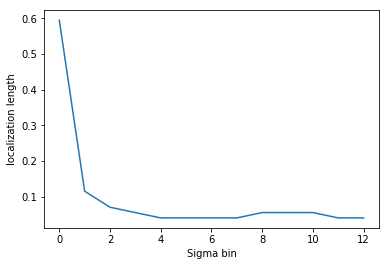

In [54]:
plt.figure()
plt.plot(opt_rho_array)
plt.xlabel('Sigma bin')
plt.ylabel('localization length')

Ens size: 60 

Ens of ens size: 20 

Current singular values: slice(0, 1, None) 

Minimize norm2 error: 0.595 

Minimize average angle among ensembles: 0.595 

Minimize average angle from truth: 0.595 

Current singular values: slice(1, 5, None) 

Minimize norm2 error: 0.07 

Minimize average angle among ensembles: 0.115 

Minimize average angle from truth: 0.07 

Current singular values: slice(5, 9, None) 

Minimize norm2 error: 0.13 

Minimize average angle among ensembles: 0.07 

Minimize average angle from truth: 0.055 

Current singular values: slice(9, 13, None) 

Minimize norm2 error: 0.085 

Minimize average angle among ensembles: 0.055 

Minimize average angle from truth: 0.055 

Current singular values: slice(13, 17, None) 

Minimize norm2 error: 0.055 

Minimize average angle among ensembles: 0.04 

Minimize average angle from truth: 0.04 

Current singular values: slice(17, 21, None) 

Minimize norm2 error: 0.07 

Minimize average angle among ensembles: 0.04 

Minimize aver

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Current singular values: slice(59, 67, None) 

Minimize norm2 error: 0.13 

Minimize average angle among ensembles: 0.04 

Minimize average angle from truth: 0.055 



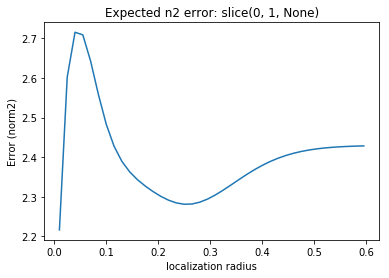

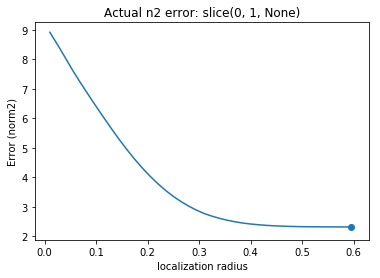

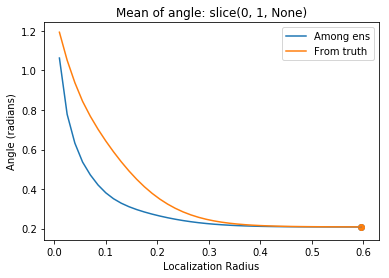

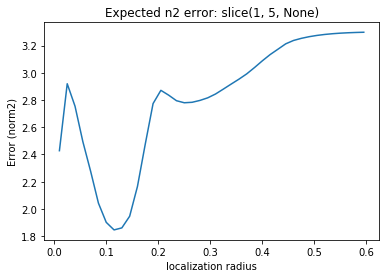

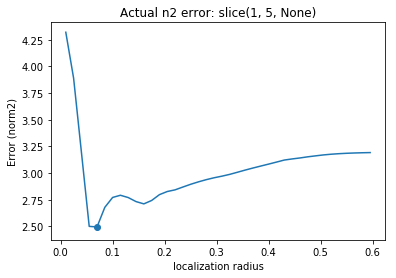

...

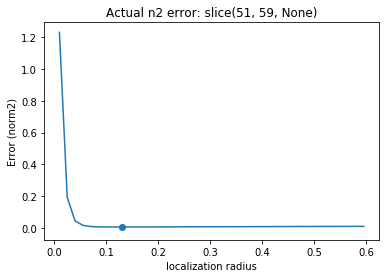

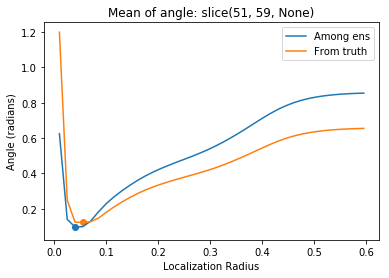

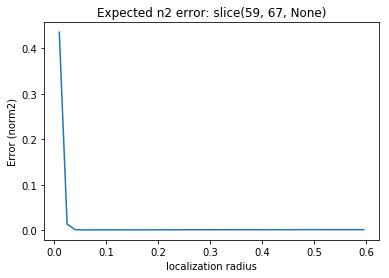

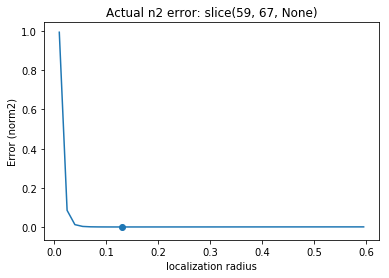

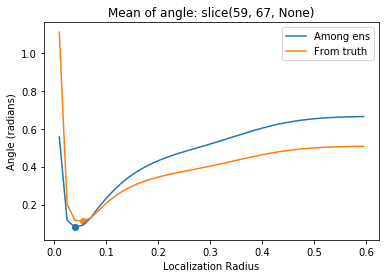

In [55]:
last_sig = 0
print(f'Ens size: {ens_size}', '\n')
print(f'Ens of ens size: {ens_ens_size}', '\n')
for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    last_sig = last_sig + sig_num
    print(f'Current singular values: {sig_slice}', '\n')

    e2_arg = error_n2[sig_count].argmin()
    this_rho = rho_array[e2_arg]
    print(f'Minimize norm2 error: {this_rho:0.4}', '\n')

    ea_arg = V_average_angle[sig_count].argmin()
    this_rho = rho_array[ea_arg]
    print(f'Minimize average angle among ensembles: {this_rho:0.4}', '\n')

    aa_arg = V_average_angle_2_truth[sig_count].argmin()
    this_rho = rho_array[aa_arg]
    print(f'Minimize average angle from truth: {this_rho:0.4}', '\n')
    
    plt.figure()
    plt.plot(rho_array, exp_error_n2[sig_count])
    plt.title(f'Expected n2 error: {sig_slice}')
    plt.ylabel('Error (norm2)')
    plt.xlabel('localization radius')

    plt.figure()
    plt.plot(rho_array, error_n2[sig_count])
    plt.scatter(rho_array[e2_arg],
                error_n2[sig_count, e2_arg])
    plt.title(f'Actual n2 error: {sig_slice}')
    plt.ylabel('Error (norm2)')
    plt.xlabel('localization radius')


    plt.figure()
    plt.plot(rho_array, V_average_angle[sig_count])
    plt.plot(rho_array, V_average_angle_2_truth[sig_count])
    plt.scatter(rho_array[ea_arg],
                V_average_angle[sig_count, ea_arg])
    plt.scatter(rho_array[aa_arg],
                V_average_angle_2_truth[sig_count, aa_arg])
    plt.legend(['Among ens', 'From truth'])
    plt.xlabel('Localization Radius')
    plt.ylabel('Angle (radians)')
    plt.title(f'Mean of angle: {sig_slice}')

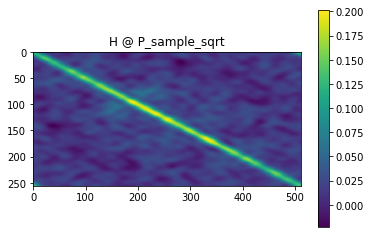

In [56]:
this_P_sqrt = covariance.matrix_sqrt(P_sample).real
imshow(H @ this_P_sqrt, 'H @ P_sample_sqrt')

# Using 'opt' singular values

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


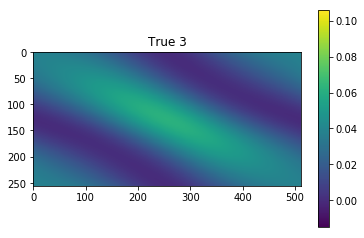

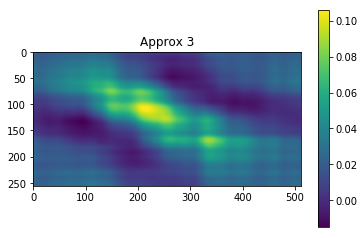

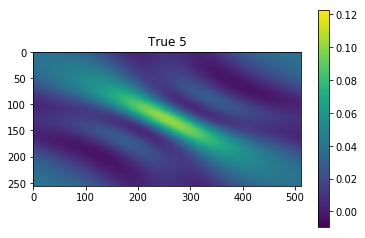

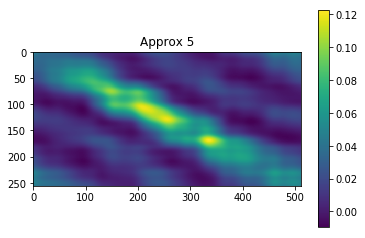

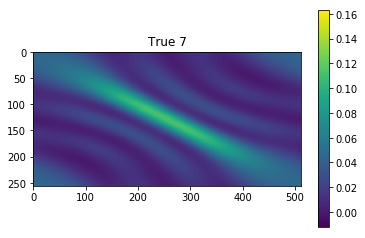

...

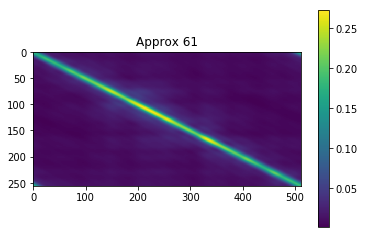

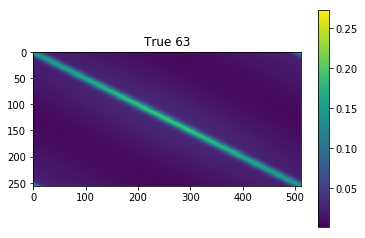

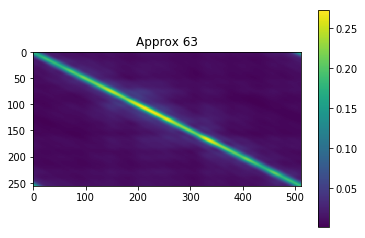

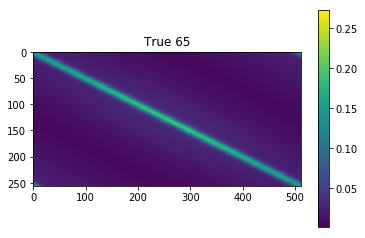

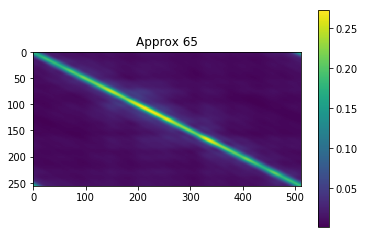

In [57]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig])
    this_recon = (
        opt_U_array[:, :this_sig]
        @ np.diag(opt_s_array[:this_sig])
        @ opt_V_array[:, :this_sig].T)

#         this_recon = (
#             opt_U_array[:, :this_sig, ens_count]
#             @ S[:this_sig, :this_sig]
#             @ opt_V_array[:, :this_sig, ens_count].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

# Using True singular values


/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


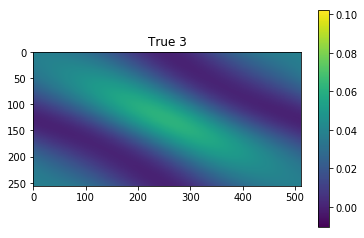

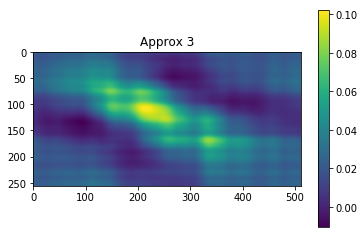

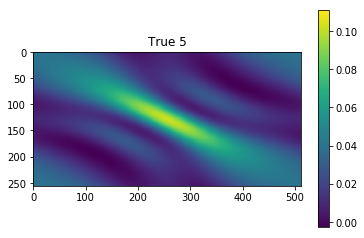

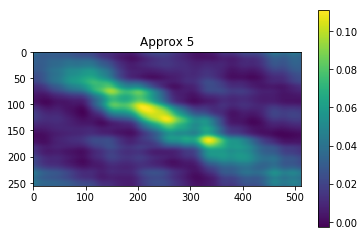

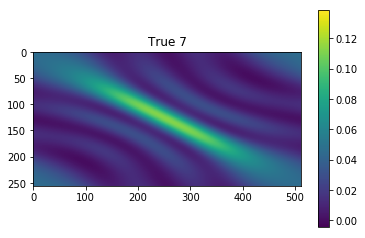

...

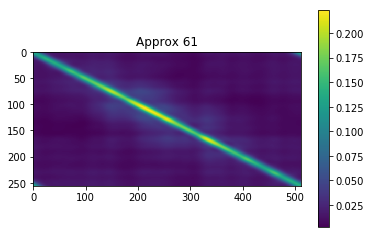

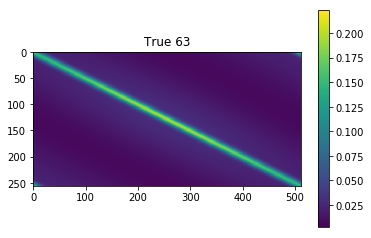

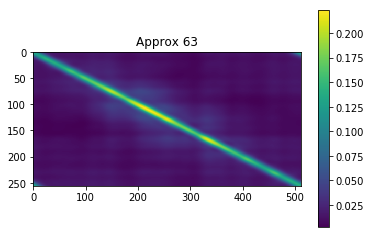

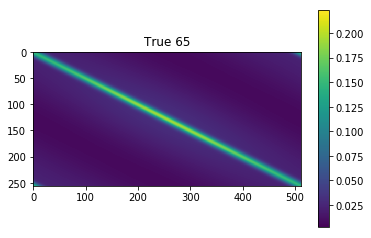

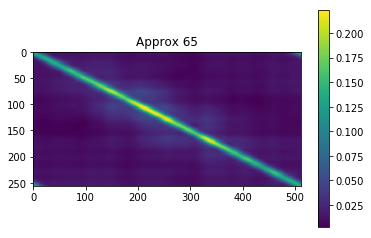

In [58]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig])
        
    this_recon = (
        opt_U_array[:, :this_sig]
        @ S[:this_sig, :this_sig]
        @ opt_V_array[:, :this_sig].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

In [59]:
sample_U_array = np.ones([obs_size, total_sig, ens_ens_size])
sample_s_array = np.ones([total_sig, ens_ens_size])
sample_V_array = np.ones([dimension, total_sig, ens_ens_size])
for ens_count in range(ens_ens_size):
    this_P = P_sample_array[:, :, ens_count]
    this_trans_mats = assimilate.transformation_matrices(
        H, P=this_P,
        R=R, return_Ts=True)

    aU = this_trans_mats['U']
    aS = this_trans_mats['S']
    aVT = this_trans_mats['VT']

    sample_U_array[:, :, ens_count] = aU[:, :total_sig]
    sample_s_array[:, ens_count] = aS.diagonal()[:total_sig]
    sample_V_array[:, :, ens_count] = aVT[:total_sig, :].T

# Using Sample singular values


/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


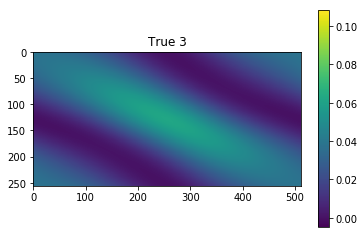

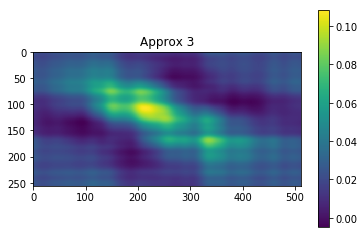

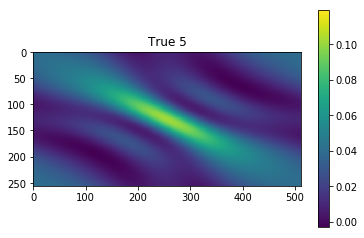

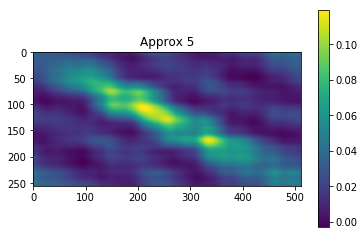

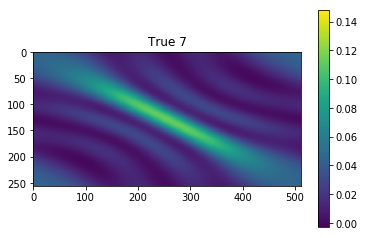

...

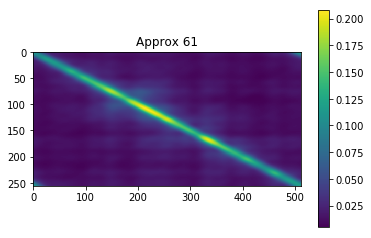

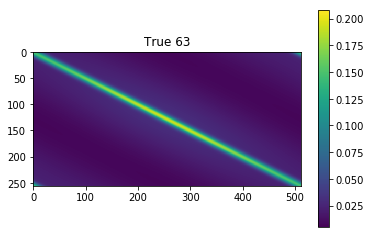

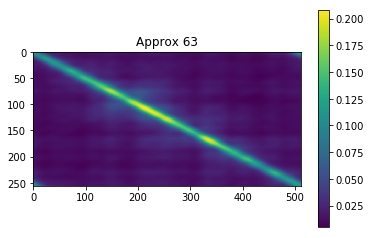

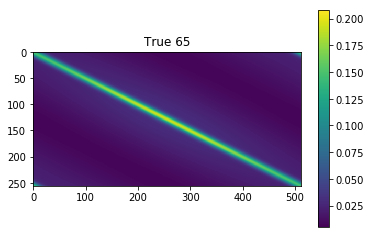

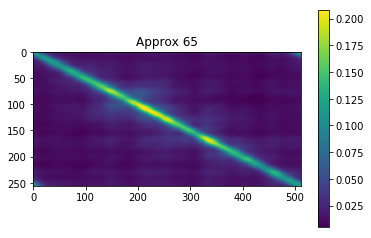

In [60]:
for this_sig in np.arange(3, total_sig, 2):
    real_recon = (U[:, :this_sig]
                  @ S[:this_sig, :this_sig]
                  @ VT[:this_sig]) 
    this_recon = (
        opt_U_array[:, :this_sig]
        @ np.diag(sample_s_array[:this_sig, 0])
        @ opt_V_array[:, :this_sig].T)

    vmin = np.min([this_recon.min(), real_recon.min()])
    vmax = np.max([this_recon.max(), real_recon.max()])
    imshow(real_recon, vmin=vmin, vmax=vmax,
           title='True ' + str(this_sig))
    imshow(this_recon, vmin=vmin, vmax=vmax,
           title='Approx ' + str(this_sig))

In [61]:
# plt.figure()
# plt.plot(S.diagonal()[:total_sig])
# plt.plot(sample_s_array[:total_sig], marker='.')
# plt.plot(opt_s_array[:total_sig])

# plt.figure()
# plt.semilogy(S.diagonal()[:total_sig])
# plt.semilogy(sample_s_array[:total_sig], marker='.')
# plt.semilogy(opt_s_array[:total_sig])

In [62]:
# sample_angle = np.ones(sig_bin_num) * np.nan
# last_sig = 0

# for sig_count, sig_num in enumerate(sig_array):
#     sig_slice = slice(last_sig, last_sig + sig_num)
#     last_sig = last_sig + sig_num
#     this_true_V = VT[sig_slice].T
#     angles = np.ones(ens_ens_size) * np.nan
#     for ens_count in range(ens_ens_size):
#         this_V = sample_V_array[:, sig_slice, ens_count]
#         angles[ens_count] = angle(this_V, this_true_V)
#     sample_angle[sig_count] = angles.mean()

In [63]:
trans_mats = assimilate.transformation_matrices(
    H, P=P_sample,
    R=R, return_Ts=True)

for key, val in trans_mats.items():
    print(key)
    exec(key + '_sample'+ '=val')

P_sqrt
P_inv_sqrt
R_sqrt
R_inv_sqrt
U
S
VT
H
Tx
Tx_inv
Ty
Ty_inv


In [64]:
sample_angle = np.ones(sig_bin_num) * np.nan
localized_angle = np.ones(sig_bin_num) * np.nan
last_sig = 0

for sig_count, sig_num in enumerate(sig_array):
    sig_slice = slice(last_sig, last_sig + sig_num)
    last_sig = last_sig + sig_num
    this_true_V = VT[sig_slice].T
    
    this_V = VT_sample[sig_slice].T
    sample_angle[sig_count] = angle(this_V, this_true_V)
    
    this_V = opt_V_array[:, sig_slice]
    localized_angle[sig_count] = angle(this_V, this_true_V)

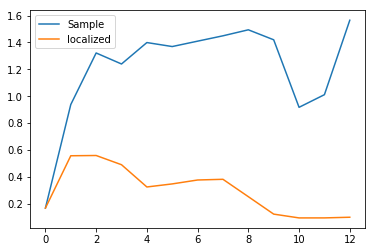

In [65]:
plt.figure()
plt.plot(sample_angle)

plt.plot(localized_angle)
plt.legend(['Sample',
            'localized'])

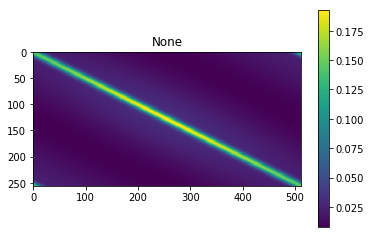

In [66]:
imshow(H @ P_sqrt)

In [67]:
# truth = H @ P_sqrt
# true_reconstruct = (
#     U[:, :total_sig]
#     @ S[:total_sig, :total_sig]
#     @ VT[:total_sig, :])
# sample_reconstruct = (
#     U_sample[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ VT_sample[:total_sig, :])
# # opt_reconstruct = (
# #     opt_U_array[:, :total_sig]
# #     @ S_sample[:total_sig, :total_sig]
# #     @ opt_V_array[:, :total_sig].T)
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ np.diag(opt_s_array[:total_sig])
#     @ opt_V_array[:, :total_sig].T)
# vmin = np.min([
#     truth.min(),
#     true_reconstruct.min(),
#     sample_reconstruct.min(),
#     opt_reconstruct.min()
# ])
# vmax = np.max([
#     truth.max(),
#     true_reconstruct.max(),
#     sample_reconstruct.max(),
#     opt_reconstruct.max()
# ])
# imshow(truth,
#        vmin=vmin, vmax=vmax)
# imshow(true_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(sample_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(opt_reconstruct,
#        vmin=vmin, vmax=vmax)

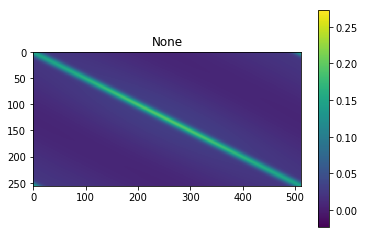

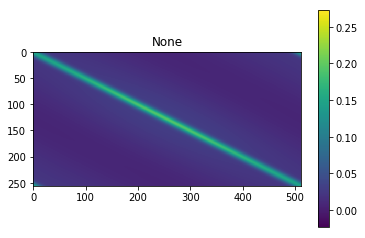

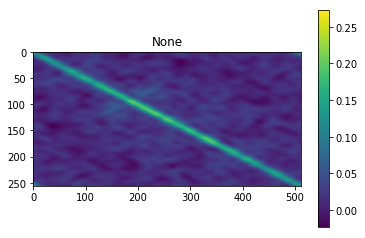

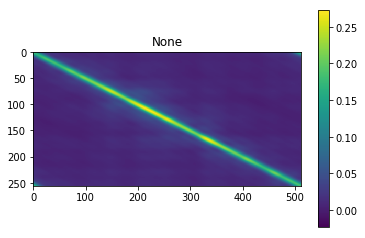

In [68]:
this_total_sig = total_sig

truth = H @ P_sqrt
true_reconstruct = (
    U[:, :this_total_sig]
    @ S[:this_total_sig, :this_total_sig]
    @ VT[:this_total_sig, :])
sample_reconstruct = (
    U_sample[:, :this_total_sig]
    @ S_sample[:this_total_sig, :this_total_sig]
    @ VT_sample[:this_total_sig, :])
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ opt_V_array[:, :total_sig].T)
opt_reconstruct = (
    opt_U_array[:, :this_total_sig]
    @ np.diag(opt_s_array[:this_total_sig])
    @ opt_V_array[:, :this_total_sig].T)
vmin = np.min([
    truth.min(),
    true_reconstruct.min(),
    sample_reconstruct.min(),
    opt_reconstruct.min()
])
vmax = np.max([
    truth.max(),
    true_reconstruct.max(),
    sample_reconstruct.max(),
    opt_reconstruct.max()
])
imshow(truth,
       vmin=vmin, vmax=vmax)
imshow(true_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(sample_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct,
       vmin=vmin, vmax=vmax)

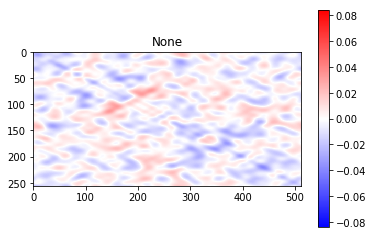

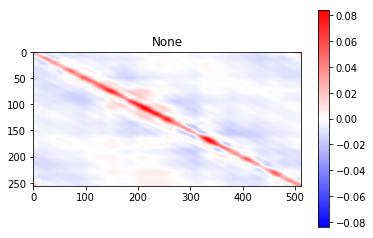

In [69]:
error_sample = (sample_reconstruct
                - true_reconstruct)
error_opt = (opt_reconstruct
             - true_reconstruct)
vmax = np.max([
    np.abs(error_sample).max(),
    np.abs(error_opt).max()
])

imshow(error_sample,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')

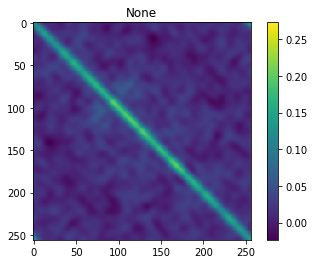

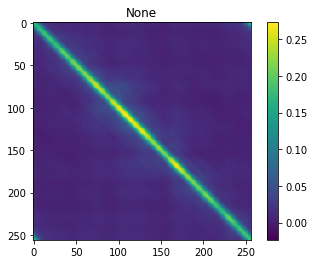

In [70]:
vmin = np.min([(sample_reconstruct @ H.T).min(),
               (opt_reconstruct @ H.T).min()])
vmax = np.max([(sample_reconstruct @ H.T).max(),
               (opt_reconstruct @ H.T).max()])
imshow(sample_reconstruct @ H.T, vmin=vmin, vmax=vmax)
imshow(opt_reconstruct @ H.T, vmin=vmin, vmax=vmax)

In [71]:
# truth = H @ P_sqrt
# true_reconstruct = (
#     U[:, :total_sig]
#     @ S[:total_sig, :total_sig]
#     @ VT[:total_sig, :])
# sample_reconstruct = (
#     U_sample[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ VT_sample[:total_sig, :])
# # opt_reconstruct = (
# #     opt_U_array[:, :total_sig]
# #     @ S_sample[:total_sig, :total_sig]
# #     @ opt_V_array[:, :total_sig].T)
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ np.diag(opt_s_array[:total_sig])
#     @ opt_V_array[:, :total_sig].T)

# scale = ((sample_reconstruct @ H.T).diagonal().mean()
#          / (opt_reconstruct @ H.T).diagonal().mean())
# opt_reconstruct = opt_reconstruct * scale


# vmin = np.min([
#     truth.min(),
#     true_reconstruct.min(),
#     sample_reconstruct.min(),
#     opt_reconstruct.min()
# ])
# vmax = np.max([
#     truth.max(),
#     true_reconstruct.max(),
#     sample_reconstruct.max(),
#     opt_reconstruct.max()
# ])
# imshow(truth,
#        vmin=vmin, vmax=vmax)
# imshow(true_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(sample_reconstruct,
#        vmin=vmin, vmax=vmax)
# imshow(opt_reconstruct,
#        vmin=vmin, vmax=vmax)

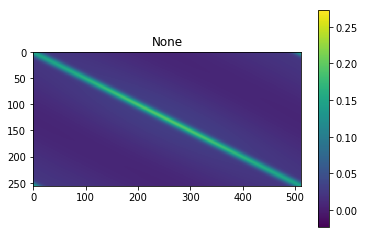

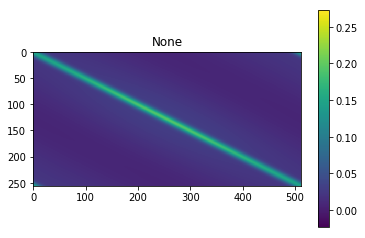

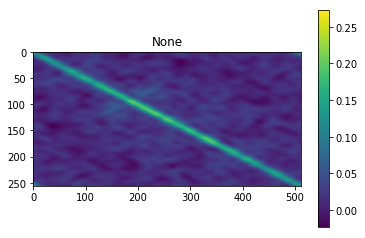

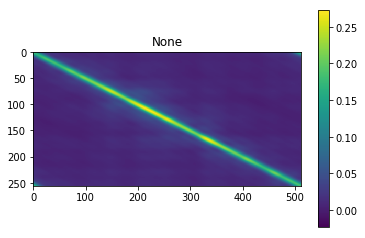

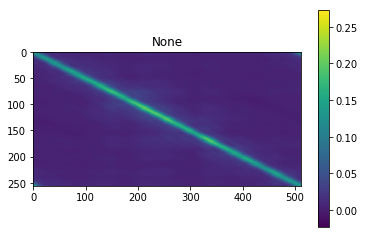

In [72]:
truth = H @ P_sqrt
true_reconstruct = (
    U[:, :this_total_sig]
    @ S[:this_total_sig, :this_total_sig]
    @ VT[:this_total_sig, :])
sample_reconstruct = (
    U_sample[:, :this_total_sig]
    @ S_sample[:this_total_sig, :this_total_sig]
    @ VT_sample[:this_total_sig, :])
# opt_reconstruct = (
#     opt_U_array[:, :total_sig]
#     @ S_sample[:total_sig, :total_sig]
#     @ opt_V_array[:, :total_sig].T)
opt_reconstruct = (
    opt_U_array[:, :this_total_sig]
    @ np.diag(opt_s_array[:this_total_sig])
    @ opt_V_array[:, :this_total_sig].T)

scale = ((sample_reconstruct @ H.T).diagonal().mean()
         / (opt_reconstruct @ H.T).diagonal().mean())
opt_reconstruct_scaled = opt_reconstruct * scale


vmin = np.min([
    truth.min(),
    true_reconstruct.min(),
    sample_reconstruct.min(),
    opt_reconstruct.min(),
    opt_reconstruct_scaled.min()
])
vmax = np.max([
    truth.max(),
    true_reconstruct.max(),
    sample_reconstruct.max(),
    opt_reconstruct.max(),
    opt_reconstruct_scaled.max()
])
imshow(truth,
       vmin=vmin, vmax=vmax)
imshow(true_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(sample_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct,
       vmin=vmin, vmax=vmax)
imshow(opt_reconstruct_scaled,
       vmin=vmin, vmax=vmax)

In [73]:
np.abs(error_sample).max()

0.039073937982734896

In [74]:
np.abs(error_opt).max()

0.08409937038534779

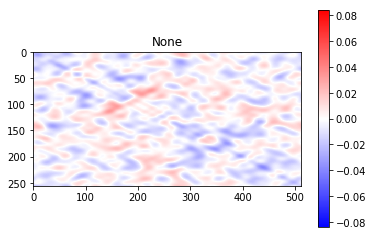

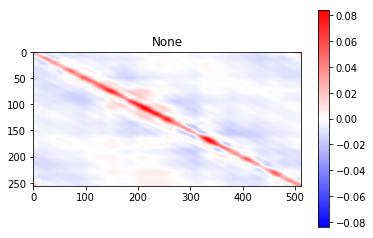

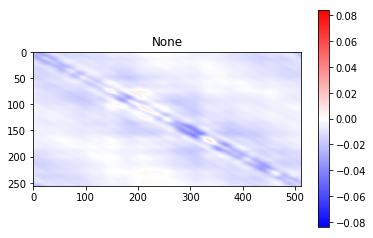

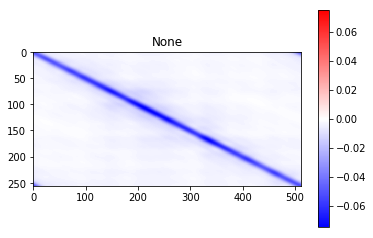

In [75]:
error_sample = (sample_reconstruct
                - true_reconstruct)
error_opt = (opt_reconstruct
             - true_reconstruct)
error_opt_scaled = (opt_reconstruct_scaled
                    - true_reconstruct)
diff_scaled = (opt_reconstruct_scaled
               - opt_reconstruct)

vmax = np.max([
    np.abs(error_sample).max(),
    np.abs(error_opt).max(),
    np.abs(error_opt_scaled).max()
])

imshow(error_sample,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')
imshow(error_opt_scaled,
      vmax=vmax,
      vmin=-vmax,
      cmap='bwr')

vmax = np.abs(diff_scaled).max()
imshow(diff_scaled,
       vmax=vmax,
       vmin=-vmax,
       cmap='bwr')

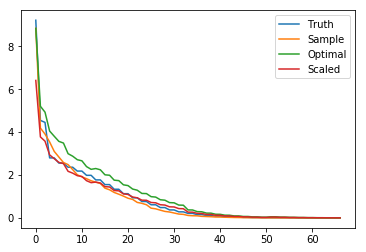

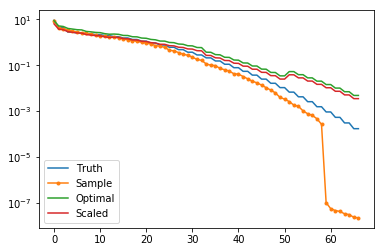

In [76]:
opt_sum = opt_s_array[:total_sig].sum()
sample_sum = S_sample.diagonal()[:total_sig].sum()
plt.figure()
plt.plot(S.diagonal()[:total_sig])
plt.plot(S_sample.diagonal()[:total_sig])
plt.plot(opt_s_array[:total_sig])
plt.plot(opt_s_array[:total_sig] * scale)
plt.legend([
    'Truth',
    'Sample',
    'Optimal',
    'Scaled'
])

plt.figure()
plt.semilogy(S.diagonal()[:total_sig])
plt.semilogy(S_sample.diagonal()[:total_sig], marker='.')
plt.semilogy(opt_s_array[:total_sig])
plt.semilogy(opt_s_array[:total_sig] * scale)
plt.legend([
    'Truth',
    'Sample',
    'Optimal',
    'Scaled'
])

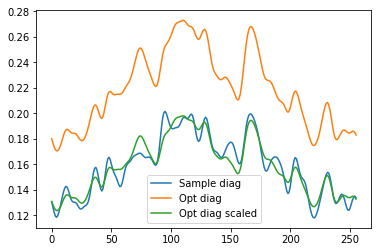

In [77]:
plt.figure()
plt.plot((sample_reconstruct @ H.T).diagonal())
plt.plot((opt_reconstruct @ H.T).diagonal())
plt.plot((opt_reconstruct_scaled @ H.T).diagonal())

plt.legend(['Sample diag',
            'Opt diag',
            'Opt diag scaled'])

Text(0,0.5,'Singular vector group')

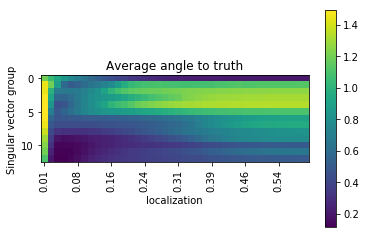

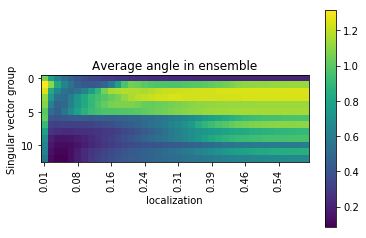

In [78]:
imshow(V_average_angle_2_truth,
       title='Average angle to truth')
plt.xticks(np.arange(rho_array.size)[::5],
           np.round(rho_array[::5], 2), rotation=90)
plt.xlabel('localization')
plt.ylabel('Singular vector group')

imshow(V_average_angle,
       title='Average angle in ensemble')
plt.xticks(np.arange(rho_array.size)[::5],
           np.round(rho_array[::5], 2), rotation=90)
plt.xlabel('localization')
plt.ylabel('Singular vector group')

/home/travisharty/anaconda3/envs/loc/lib/python3.7/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


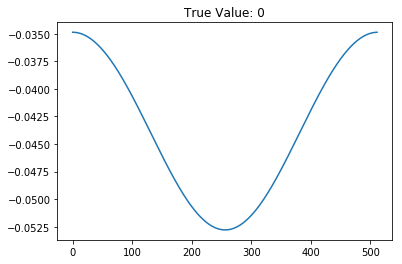

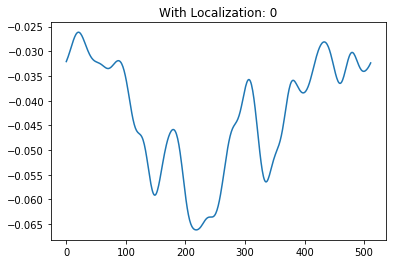

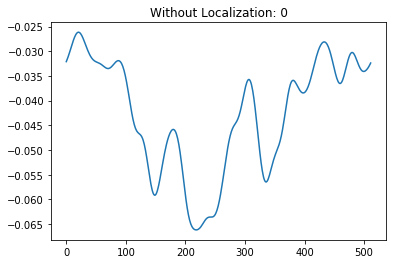

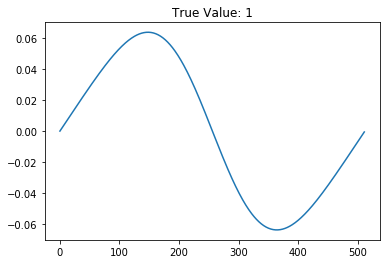

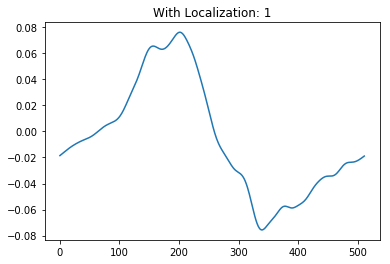

...

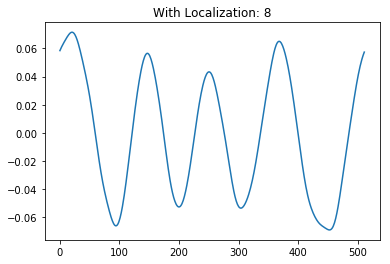

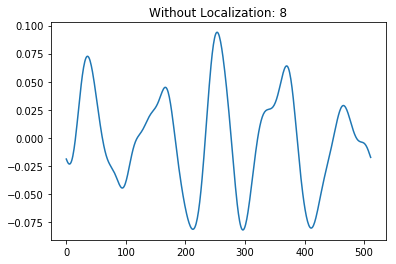

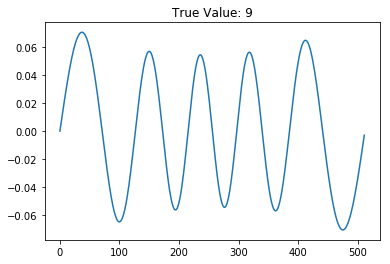

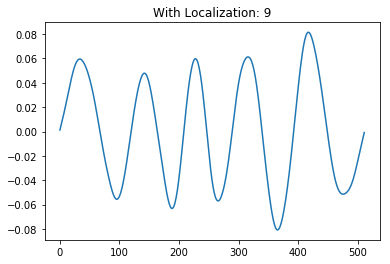

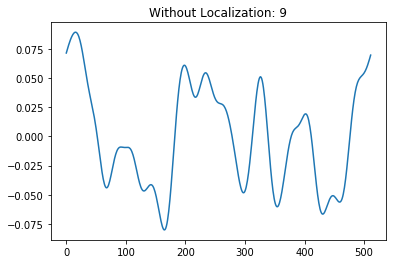

In [79]:
for this_sig in np.arange(10):
    plt.figure()
    plt.plot(VT[this_sig])
    plt.title(f'True Value: {this_sig}')
    
    plt.figure()
    plt.plot(opt_V_array[:, this_sig])
    plt.title(f'With Localization: {this_sig}')
    
    plt.figure()
    plt.plot(VT_sample[this_sig])
    plt.title(f'Without Localization: {this_sig}')
    
#     plt.figure()
#     plt.plot(sample_V_array[:, this_sig])
#     plt.title(f'Without Localization: {this_sig}')

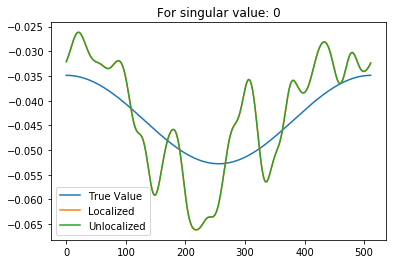

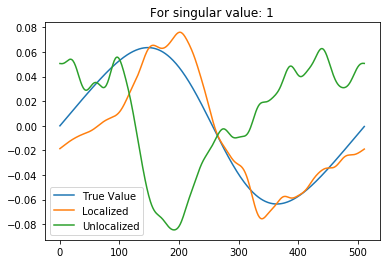

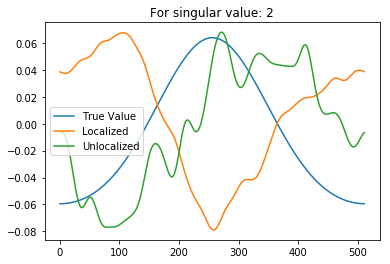

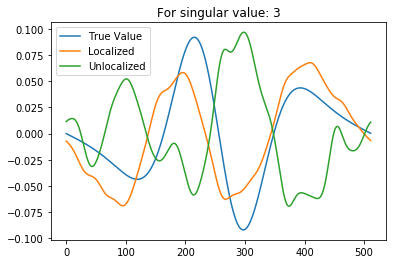

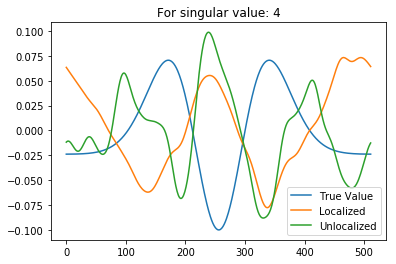

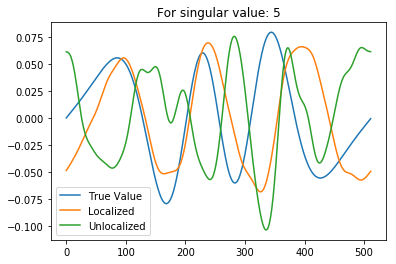

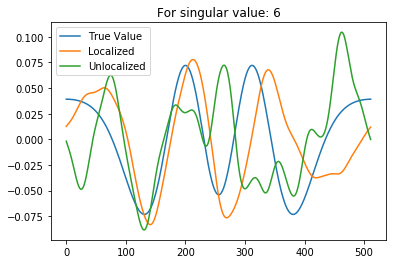

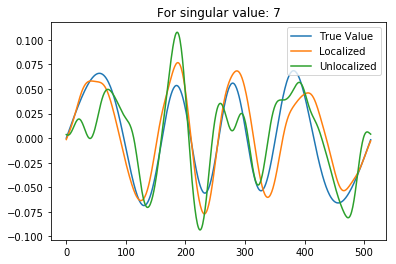

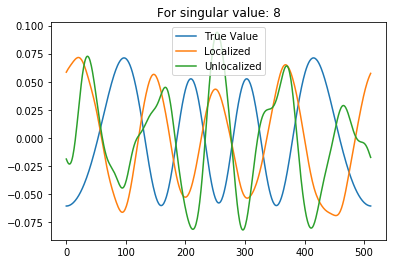

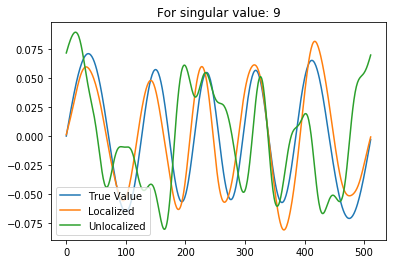

In [80]:
for this_sig in np.arange(10):
    plt.figure()
    plt.plot(VT[this_sig])
    plt.plot(opt_V_array[:, this_sig])    
    plt.plot(VT_sample[this_sig])
    plt.title(f'For singular value: {this_sig}')
    plt.legend(['True Value',
                'Localized',
                'Unlocalized'])

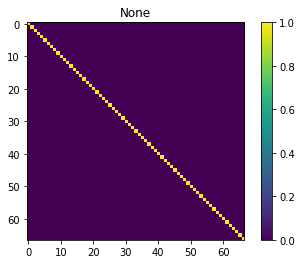

In [81]:
imshow(opt_V_array.T @ opt_V_array)

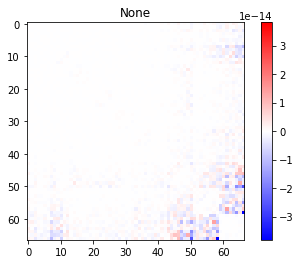

In [82]:
this = opt_V_array.T @ opt_V_array
indexes = np.diag_indices_from(this)
this[indexes] = 0
vmax = np.abs(this).max()
imshow(this, vmax=vmax, vmin=-vmax, cmap='bwr')